<a href="https://colab.research.google.com/github/SuvorkinPavel/image-recognition/blob/main/Image_recognition_Lab_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Распознавание образов
## Лабораторная работа № 2
## Выполнил студент группы М19-ИВТ-3
## Суворкин Павел
## 16.10.2020

#Image recognition
##Laboratory work №2
##Performed by a student of the M19-IVT-3 group
## Suvorkin Pavel
##16/10/2020

In [2]:
!pip install Pillow

In [3]:
pip install scipy==1.1.0

In [5]:
# This block consists of nesessary libraries and frameworks
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
from IPython.display import Image, display
from scipy.ndimage.filters import generic_filter

from cv2 import imread, imshow
#from imread import imread, convolve
#from scipy.ndimage import convolve
#from matplotlib.pyplot import imread
from scipy.ndimage import imread, convolve
from scipy.signal import convolve2d

In [6]:
# Mounting google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
# we need to check out if directories exists and create if not
def create_dirs():
  if os.path.exists('/content/drive/My Drive/Image recognition'):
    print("Image recognition directory exists!")
  else:  
    os.mkdir('/content/drive/My Drive/Image recognition')
    print("Image recognition directory has been created!")

  if os.path.exists('/content/drive/My Drive/Image recognition/Lab_2'):
    print("Lab_2 directory exists!")
  else:
    os.mkdir('/content/drive/My Drive/Image recognition/Lab_2')
    print("Lab_2 directory has been created!")

In [8]:
# creating nesessary dirs
create_dirs()

Image recognition directory exists!
Lab_2 directory exists!


In [9]:
# image paths
img_native = "/content/drive/My Drive/Image recognition/Lab_2/audi.jpg"
img_process = "/content/drive/My Drive/Image recognition/Lab_2/"

## Filters and functions

In [10]:
# Load sample data
with np.DataSource().open(img_native, "rb") as f:
    img = imread(f)

# all masks
sobel_h = np.array( [[-1, 0, 1],
                     [-2, 0, 2],
                     [-1, 0, 1]] )

sobel_v = np.array( [[-1, -2, -1],
                     [0, 0, 0],
                     [1, 2, 1]] )

roberts_v = np.array( [[0, 0, 0],
                       [0, 1, 0],
                       [0, 0,-1]] )

roberts_h = np.array( [[0, 0, 0],
                       [0, 0, 1],
                       [0,-1, 0]] )    

horisontal_ = np.array( [[0, -1, 0],
                         [0, 1, 0],
                         [0, 0, 0]] )

vertical_ = np.array( [[0, 0, 0],
                       [-1, 1, 0],
                       [0, 0, 0]] )

horisontal_vertical = np.array( [[-1, 0, 0],
                                 [0, 1, 0],
                                 [0, 0, 0]] )

no_edge = np.array( [[0, -1, 0],
                     [-1, 4, -1],
                     [0, -1, 0]] )

all_edge = np.array( [[-1, -1, -1],
                      [-1, 9, -1],
                      [-1, -1, -1]] )

north = np.array( [[1, 1, 1],
                   [1, -2, 1],
                   [-1, -1, -1]] )

north_east = np.array( [[1, 1, 1],
                        [-1, -2, 1],
                        [-1, -1, 1]] )

east = np.array( [[-1, 1, 1],
                  [-1, -2, 1],
                  [-1, 1, 1]] )

south_east = np.array( [[-1, -1, 1],
                        [-1, -2, 1],
                        [1, 1, 1]] )

south = np.array( [[-1, -1, -1],
                   [1, -2, 1],
                   [1, 1, 1]] )

south_west = np.array( [[1, -1, -1],
                        [1, -2, -1],
                        [1, 1, 1]] )

west = np.array( [[1, 1, -1],
                  [1, -2, -1],
                  [1, 1, -1]] )

north_west = np.array( [[1, 1, 1],
                        [1, -2, -1],
                        [1, -1, -1]] )

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0.
Use ``matplotlib.pyplot.imread`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until


In [21]:
def sobel(img):
    # sobel filter
    horizontal = convolve2d(img, sobel_h, "same", "symm")
    vertical = convolve2d(img, sobel_v, "same", "symm")
    output_image = np.abs(horizontal) + np.abs(vertical)
    return output_image

def roberts(image):
    # roberts filter
    vertical = convolve( image, roberts_v )
    horizontal = convolve( image, roberts_h )
    output_image = np.sqrt( np.square(horizontal) + np.square(vertical))
    return output_image

def find_edge(img, matrix):
    horizontal = convolve2d(img, matrix, "same", "symm")
    vertical = convolve2d(img, matrix, "same", "symm")
    output_image = np.abs(horizontal) + np.abs(vertical)
    return output_image

## Image preprocessing

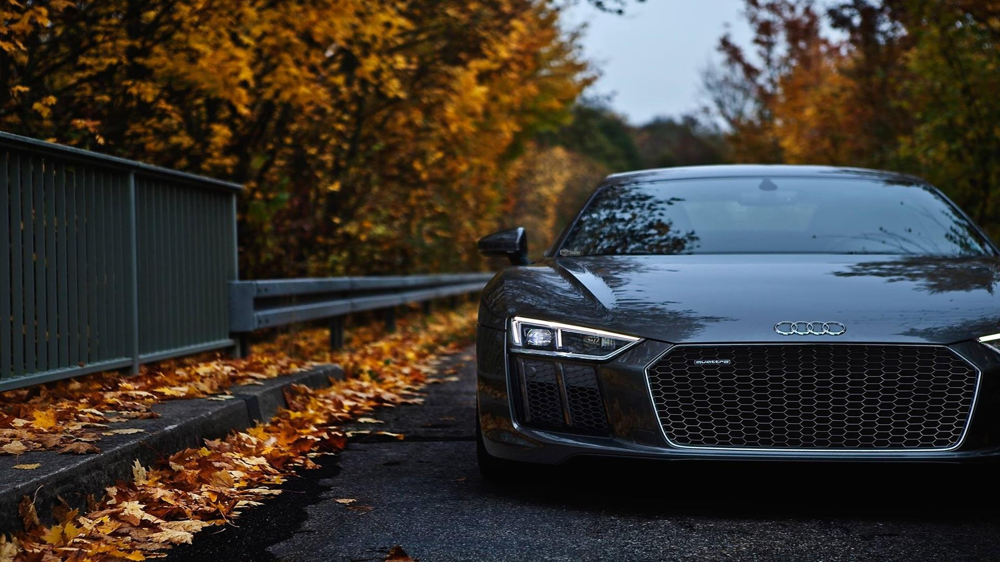

In [12]:
im = cv2.imread(img_native)
# show image
display(Image(img_native))

In [13]:
print(img)

[[[ 20   3   0]
  [ 24  10   1]
  [ 29  14   7]
  ...
  [ 47  26   9]
  [ 46  25   8]
  [ 44  23   6]]

 [[ 20   6   0]
  [ 24   9   2]
  [ 27  12   5]
  ...
  [ 42  21   4]
  [ 41  20   3]
  [ 40  19   2]]

 [[ 24   9   2]
  [ 23  10   2]
  [ 22   9   3]
  ...
  [ 41  20   1]
  [ 40  19   0]
  [ 39  18   0]]

 ...

 [[106  72  27]
  [129  95  50]
  [149 115  69]
  ...
  [ 16  16  18]
  [ 18  18  20]
  [ 19  19  21]]

 [[ 95  58  14]
  [125  88  43]
  [151 114  69]
  ...
  [ 17  17  19]
  [ 17  17  19]
  [ 18  18  20]]

 [[ 85  48   3]
  [119  83  35]
  [148 112  64]
  ...
  [ 16  16  18]
  [ 17  17  19]
  [ 16  16  18]]]


In [14]:
img.shape

(1080, 1920, 3)

In [15]:
# RGB image has 3 dimention, but we need only 2, so we vake it grayscale

(1080, 1920)
[[  4   9  14 ...  23  22  20]
 [  6   9  12 ...  18  17  16]
 [  9   9   9 ...  16  15  15]
 ...
 [ 62  85 105 ...  17  19  20]
 [ 49  79 105 ...  18  18  19]
 [ 39  73 102 ...  17  18  17]]


<Figure size 432x288 with 0 Axes>

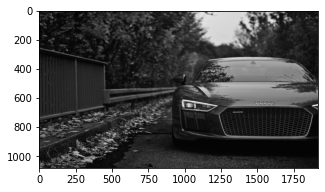

In [16]:
im = cv2.imread(img_native)
gray = cv2.cvtColor(im, cv2.COLOR_RGB2GRAY)
#alternative: gray = img[:, :, 0]
print(gray.shape)
print(gray)
# show image
plt.gray()
plt.figure(figsize =(5, 5))
plt.imshow(gray)

## Experiments

sobel


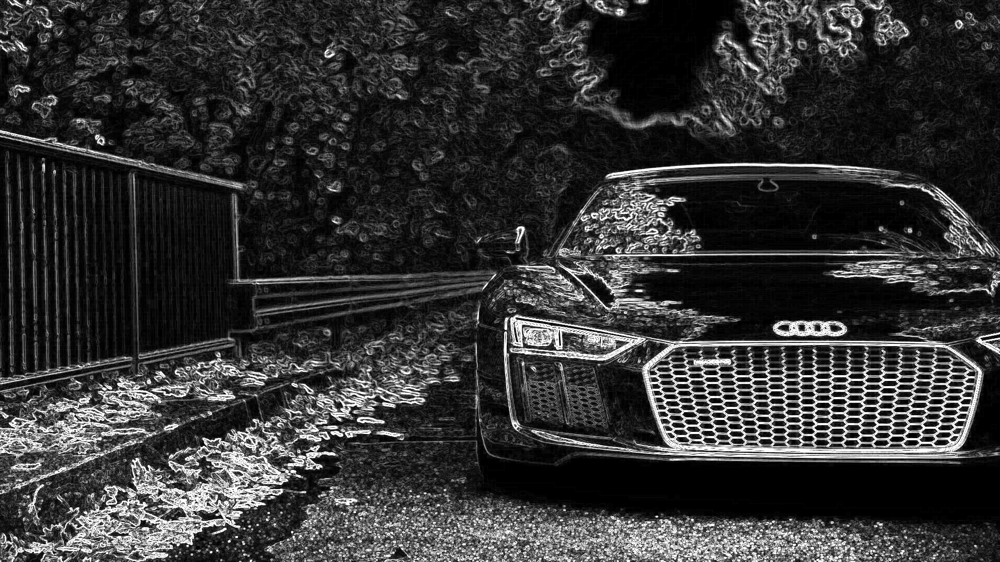

In [19]:
print("sobel")
frame = sobel(gray)
img_sobel = img_process + "sobel.jpg"
cv2.imwrite(img_sobel, frame)
display(Image(img_sobel))

In [45]:
# have no idea what's wrong O_o
print("roberts")
frame = roberts(gray)
img_roberts = img_process + "rbs.jpg"
cv2.imwrite(img_roberts, frame)
display(Image(img_roberts))

roberts
/content/drive/My Drive/Image recognition/Lab_2/rbs.jpg


TypeError: ignored

horisontal


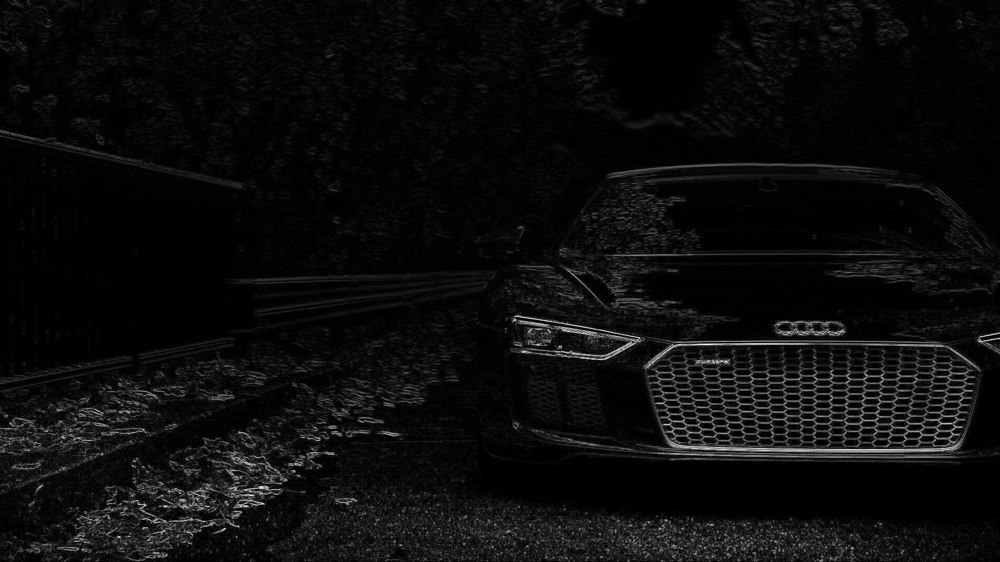

In [24]:
print("horisontal")
frame = find_edge(gray, horisontal_)
img_horisontal = img_process + "horisontal.jpg"
cv2.imwrite(img_horisontal, frame)
display(Image(img_horisontal))


vertical


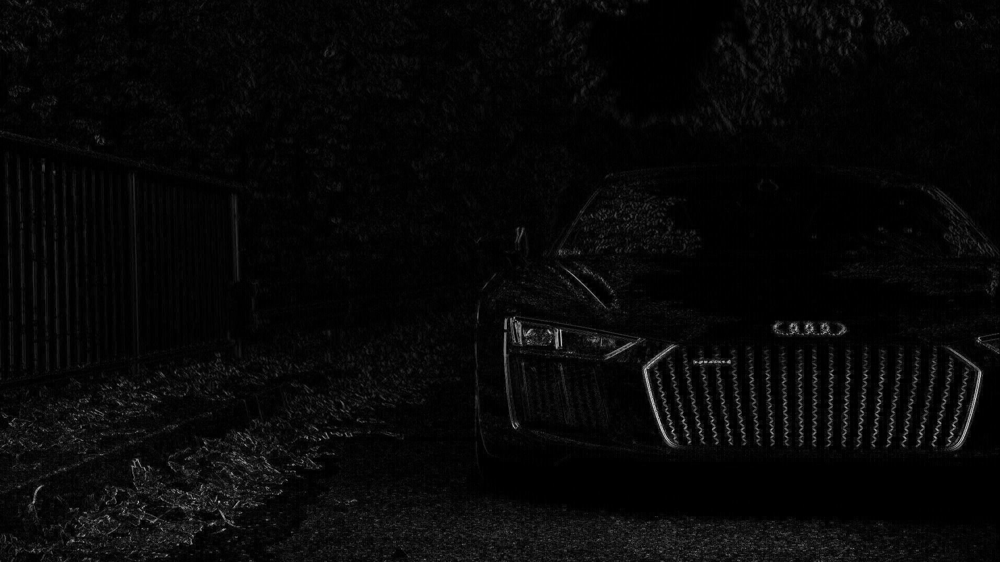

In [25]:
print("vertical")
frame = find_edge(gray, vertical_)
img_vertical = img_process + "vertical.jpg"
cv2.imwrite(img_vertical, frame)
display(Image(img_vertical))

horisontal_vertical


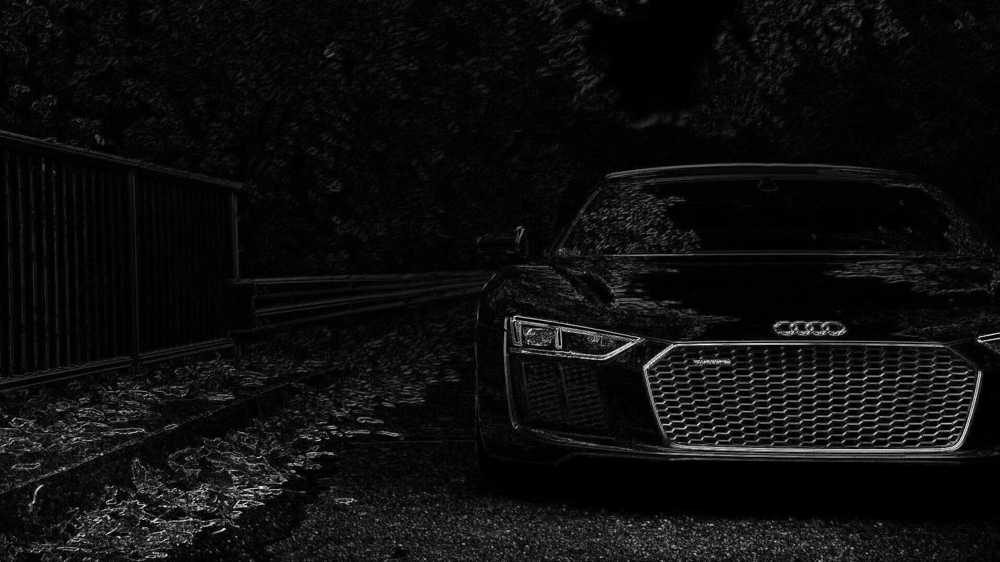

In [26]:
print("horisontal_vertical")
frame = find_edge(gray, horisontal_vertical)
img_hv = img_process + "hv.jpg"
cv2.imwrite(img_hv, frame)
display(Image(img_hv))

no_edge


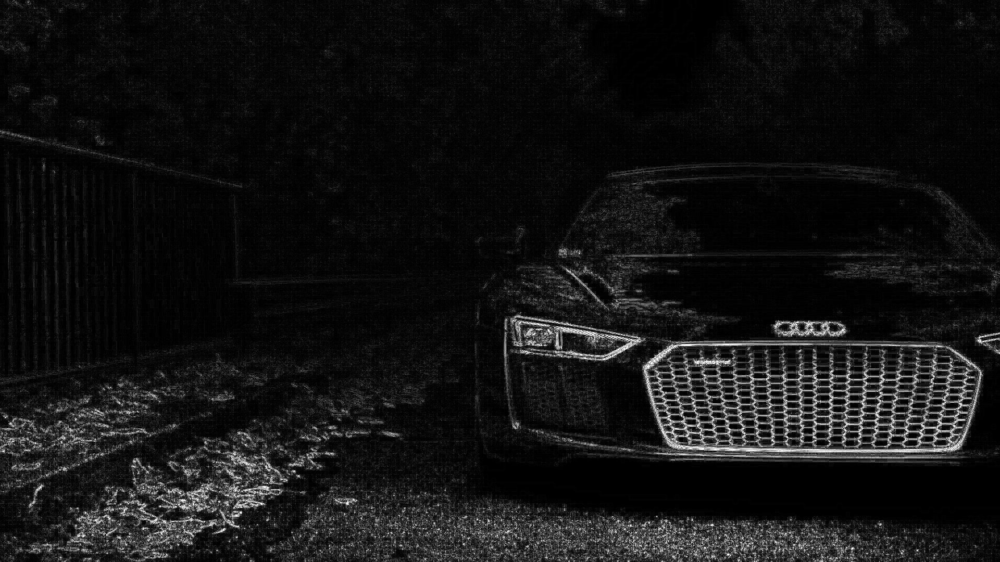

In [27]:
print("no_edge")
frame = find_edge(gray, no_edge)
img_noedge = img_process + "noedge.jpg"
cv2.imwrite(img_noedge, frame)
display(Image(img_noedge))

all_edge


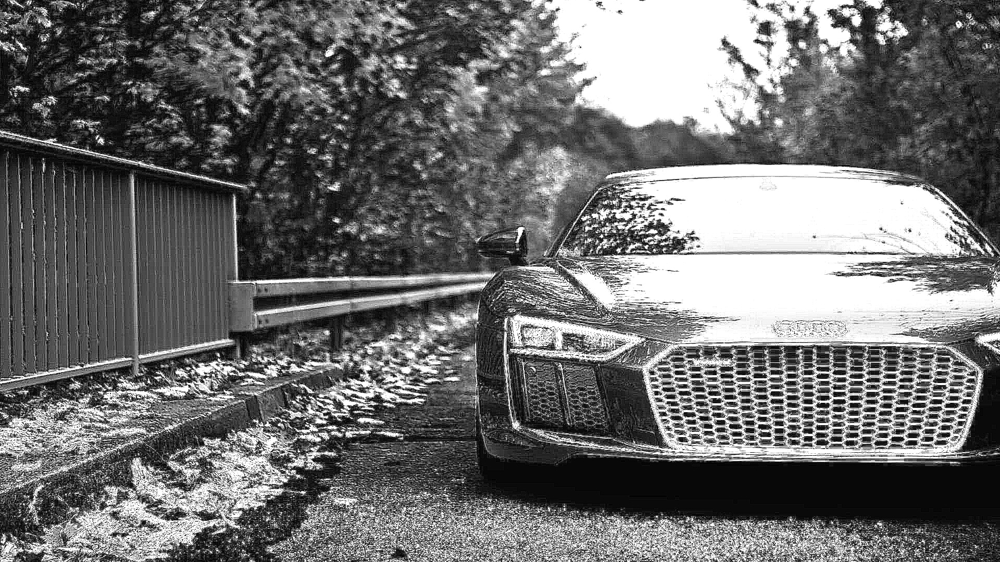

In [28]:
print("all_edge")
frame = find_edge(gray, all_edge)
img_alledge = img_process + "alledge.jpg"
cv2.imwrite(img_alledge, frame)
display(Image(img_alledge))

north


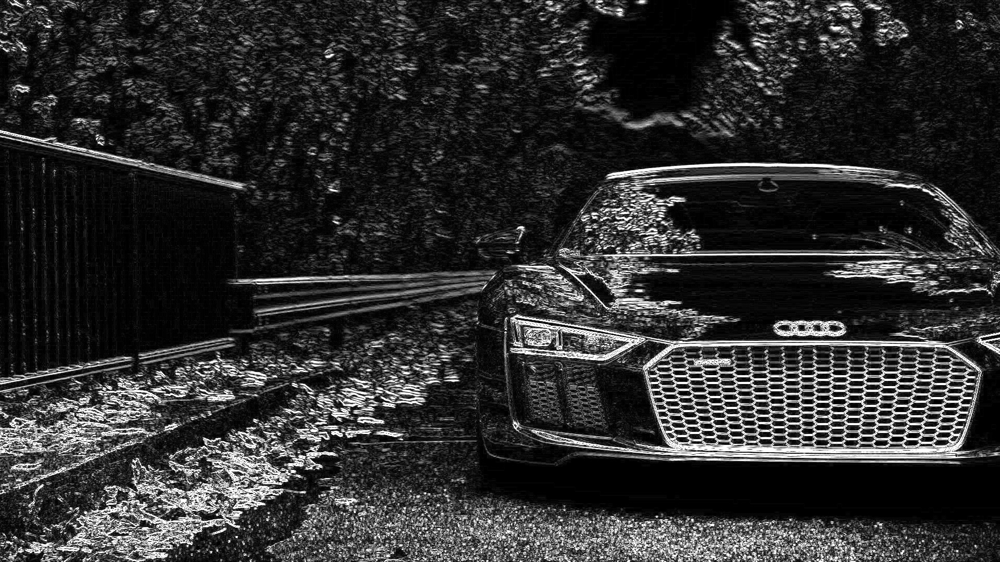

In [29]:
print("north")
frame = find_edge(gray, north)
img_north = img_process + "north.jpg"
cv2.imwrite(img_north, frame)
display(Image(img_north))

north_east


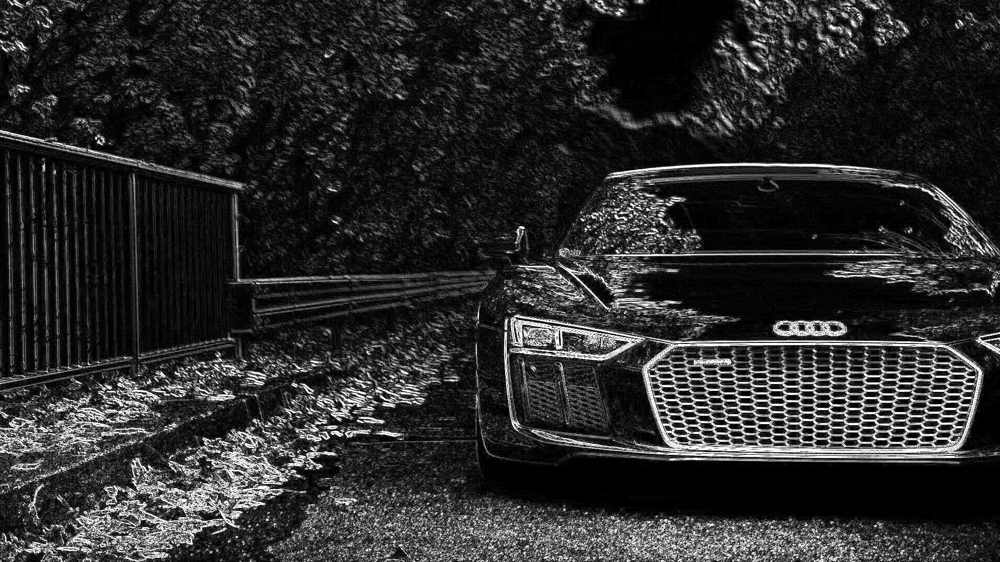

In [30]:
print("north_east")
frame = find_edge(gray, north_east)
img_ne = img_process + "ne.jpg"
cv2.imwrite(img_ne, frame)
display(Image(img_ne))

east


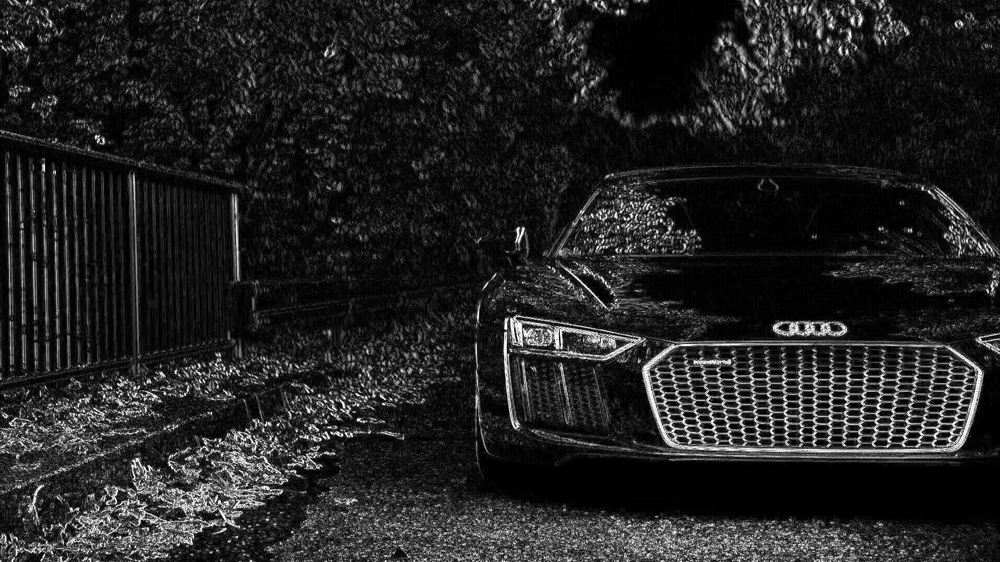

In [31]:
print("east")
frame = find_edge(gray, east)
img_east = img_process + "east.jpg"
cv2.imwrite(img_east, frame)
display(Image(img_east))

south_east


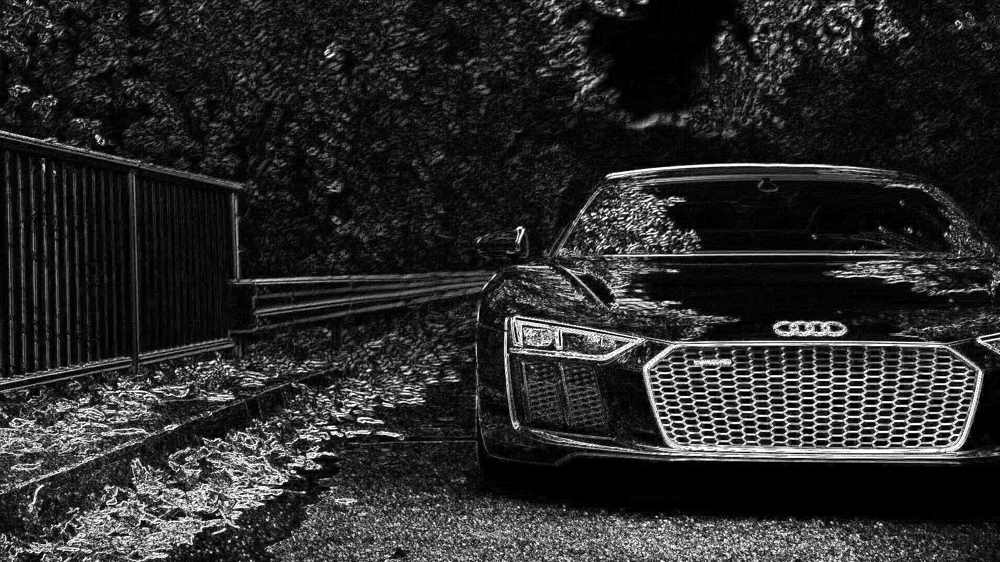

In [32]:
print("south_east")
frame = find_edge(gray, south_east)
img_se = img_process + "se.jpg"
cv2.imwrite(img_se, frame)
display(Image(img_se))

south


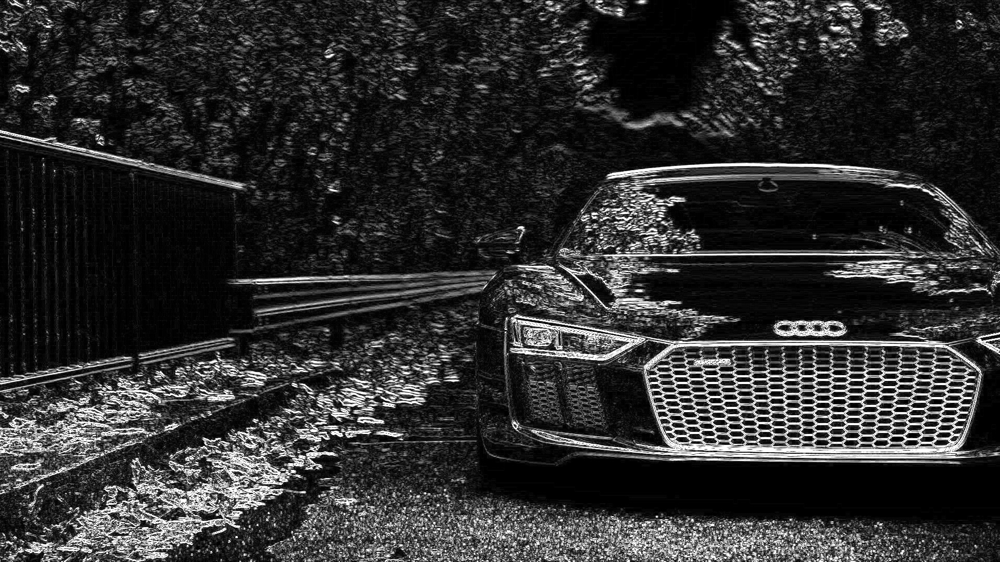

In [34]:
print("south")
frame = find_edge(gray, south)
img_south = img_process + "south.jpg"
cv2.imwrite(img_south, frame)
display(Image(img_south))

south_west


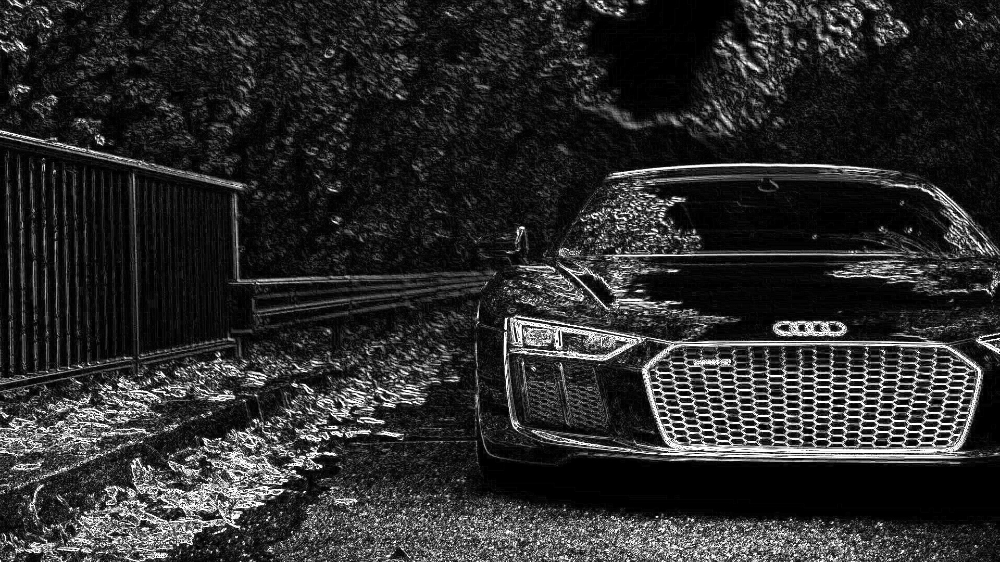

In [36]:
print("south_west")
frame = find_edge(gray, south_west)
img_sw = img_process + "sw.jpg"
cv2.imwrite(img_sw, frame)
display(Image(img_sw))


west


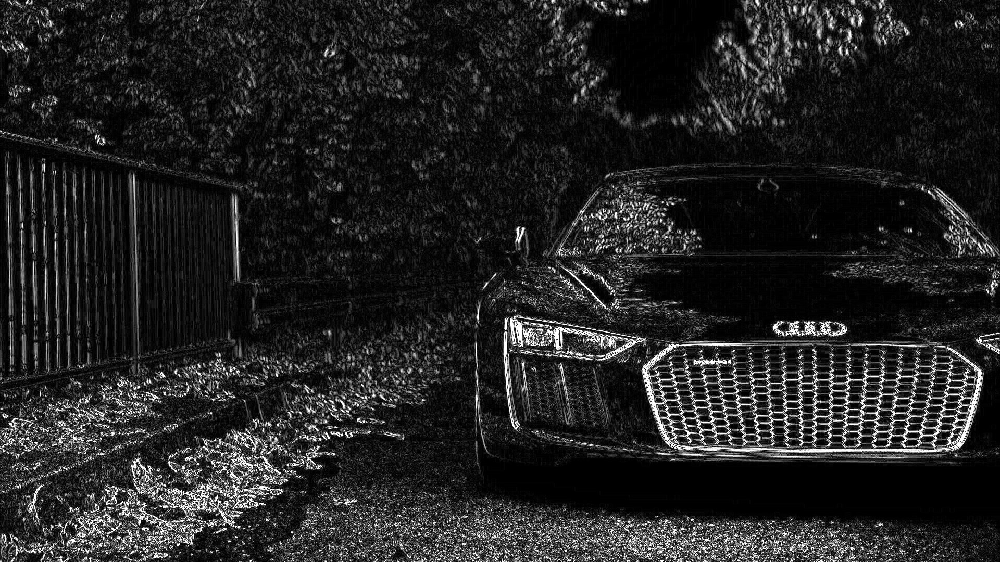

In [37]:
print("west")
frame = find_edge(gray, west)
img_west = img_process + "west.jpg"
cv2.imwrite(img_west, frame)
display(Image(img_west))

north_west


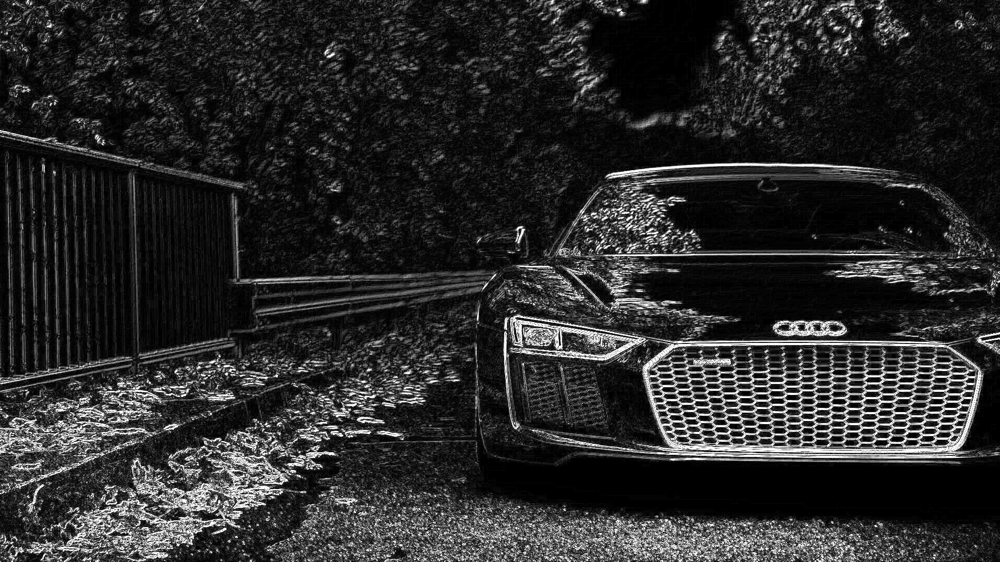

In [38]:
print("north_west")
frame = find_edge(gray, north_west)
img_nw =  img_process + "nw.jpg"
cv2.imwrite(img_nw, frame)
display(Image(img_nw))